<a href="https://colab.research.google.com/github/Mamiglia/challenge/blob/master/baseline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# !mkdir data
# !gdown 1CVAQDuPOiwm8h9LJ8a_oOs6zOWS6EgkB
# !gdown 1ykZ9fjTxUwdiEwqagoYZiMcD5aG-7rHe
# !unzip -o test.zip -d data
# !unzip -o train.zip -d data

# !git clone https://github.com/Mamiglia/challenge.git

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from pathlib import Path
from tqdm import tqdm
import numpy as np
import torch.nn.functional as F 
import heapq

from challenge.src.common import load_data, prepare_train_data, generate_submission
from challenge.src.eval import evaluate_retrieval, visualize_retrieval

In [3]:
# Configuration
MODEL_PATH = "models/mlp_baseline.pth"
EPOCHS = 20
BATCH_SIZE = 256
LR = 0.001
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TOPK=64
SIGMA=0.5

In [4]:
# Load data
train_data = load_data("data/train/train.npz")
X, y, label = prepare_train_data(train_data)

DATASET_SIZE = len(X)
# Split train/val
# This is done only to measure generalization capabilities, you don't have to
# use a validation set (though we encourage this)
n_train = int(0.9 * len(X))
TRAIN_SPLIT = torch.zeros(len(X), dtype=torch.bool)
TRAIN_SPLIT[:n_train] = 1
X_train, X_val = X[TRAIN_SPLIT], X[~TRAIN_SPLIT]
y_train, y_val = y[TRAIN_SPLIT], y[~TRAIN_SPLIT]


train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
y_train.shape[-1], X_val.shape[-1]

(125000,)
Train data: 125000 captions, 125000 images


(1536, 1024)

In [5]:
# model = MLP().to(DEVICE)
# print(f"   Parameters: {sum(p.numel() for p in model.parameters()):,}")

# # Train
# print("\n3. Training...")
# model = train_model(model, train_loader, val_loader, DEVICE, EPOCHS, LR)

# # Load best model for evaluation
# model.load_state_dict(torch.load(MODEL_PATH))

In [6]:
# ===============================================================
# ✱ 0️⃣ GRAFO kNN SULLO SPAZIO TARGET (A_Y)
#    (una tantum, offline, cpu)
# ===============================================================
def build_anchor_graph(A_Y, k=8):
    """
    A_Y: [K, Dy] tensore normalizzato degli anchor nel target.
    Ritorna: lista di adiacenza con (neighbor_idx, peso)
    Il peso è la distanza euclidea (che poi useremo come edge-cost).
    """
    with torch.no_grad():
        Ay = F.normalize(A_Y.cpu(), dim=-1)
        D = torch.cdist(Ay, Ay)
        K = Ay.size(0)
        adj = [[] for _ in range(K)]
        for i in range(K):
            vals, idx = torch.topk(D[i], k=min(k+1, K), largest=False)
            for d, j in zip(vals.tolist(), idx.tolist()):
                if j == i:
                    continue
                adj[i].append((j, float(d)))
                adj[j].append((i, float(d)))  # 👈 aggiungi questo
    return adj



In [7]:
# ===============================================================
# ✱ 2️⃣ DISTANZA "GEODESICA" QUERY → ANCHORS
#     (ancora super semplice)
# ===============================================================
def geodesic_distance_to_anchors(y0, A_Y, adj, nearest_k=4):
    """
    y0 : [B, Dy] predizione iniziale (anche euclidea)
    A_Y: [K, Dy] anchor target
    adj: grafo kNN su A_Y
    ritorna: D_geo [B, K]
    Idea minima: 
      - per ogni y0 troviamo i 'nearest_k' anchor euclidei
      - per ciascuno lanciamo Dijkstra (cachabile!) e prendiamo la dist dal suo nodo
      - la distanza y0→anchor_j è: (dist euclidea y0→ancore_base) + (geodesica base→j)
    """
    with torch.no_grad():
        Ay = F.normalize(A_Y, dim=-1)
        y0n = F.normalize(y0, dim=-1)
        # D_eucl_base: [B, K]
        D_eucl = torch.cdist(y0n.cpu(), Ay.cpu())  # su cpu per semplicità
        B, K = D_eucl.shape

        # 1) per ogni query scegliamo i nearest_k anchor di partenza
        vals, idx = torch.topk(D_eucl, k=min(nearest_k, K), largest=False, dim=-1)

        # 2) precomputiamo dijkstra per TUTTI gli anchor che ci servono
        needed_sources = sorted(set(idx.flatten().tolist()))
        geo_cache = {}
        for s in needed_sources:
            geo_cache[s] = dijkstra_from(s, adj)  # lista di len K

        # 3) ricostruiamo la matrice geodetica
        D_geo = torch.full((B, K), float("inf"))
        for b in range(B):
            for t in range(idx.size(1)):
                base_anchor = int(idx[b, t].item())
                base_cost = float(vals[b, t].item())
                geos = geo_cache[base_anchor]  # len K
                # distanza = costo euclideo fino al base + geodesica base→j
                for j in range(K):
                    cand = base_cost + geos[j]
                    if cand < D_geo[b, j]:
                        D_geo[b, j] = cand
        return D_geo  # [B, K]

In [8]:
# ===============================================================
# ✱ 1️⃣ DIJKSTRA LEGGERO: DISTANZA GEODESICA DA UN NODO A TUTTI
# ===============================================================


def dijkstra_from(src, adj):
    """
    src: indice dell'anchor di partenza
    adj: lista di adiacenza
    ritorna: lista distanze geodetiche approssimate da src a tutti
    """
    N = len(adj)
    dist = [float("inf")] * N
    dist[src] = 0.0
    h = [(0.0, src)]
    while h:
        d, u = heapq.heappop(h)
        if d > dist[u]:
            continue
        for v, w in adj[u]:
            nd = d + w
            if nd < dist[v]:
                dist[v] = nd
                heapq.heappush(h, (nd, v))
    return dist

In [9]:
# ===============================================================
# ✱ 3️⃣ Traduttore zero-shot GEODESICO (plug-in)
# ===============================================================
def zero_shot_translate_geodesic_fast(X, A_X, A_Y, GEO_ALL,
                                      sigma=1.0, topk=64, nearest_k=4):
    """
    1. facciamo la solita predizione euclidea grezza nel target
    2. usiamo quella per misurare D_geo rispetto agli anchor target
    3. pesiamo con il kernel come prima
    """
    with torch.no_grad():
        Y0 = zero_shot_translate_gaussian(
            X, A_X, A_Y,
            sigma=0.7,
            topk=min(64, A_X.size(0))
        )
    Ay  = F.normalize(A_Y, dim=-1).cpu()
    Y0n = F.normalize(Y0, dim=-1).cpu()
    D_eucl = torch.cdist(Y0n, Ay)              # [B,K]

    B, K = D_eucl.shape
    vals, idx = torch.topk(D_eucl, k=min(nearest_k, K), largest=False, dim=-1)

    D_geo = torch.full((B, K), float("inf"))
    GEO = GEO_ALL.cpu()
    for b in range(B):
        for t in range(idx.size(1)):
            a = int(idx[b, t])
            base = float(vals[b, t])
            D_geo[b] = torch.minimum(D_geo[b], base + GEO[a])

    if topk is not None and topk < K:
        v, ix = torch.topk(-D_geo, k=topk, dim=-1)
        M = torch.full_like(D_geo, float("inf"))
        M.scatter_(dim=-1, index=ix, src=-v)
        D_geo = M

    W = torch.exp(-D_geo / (2 * sigma ** 2))
    W = W / (W.sum(dim=-1, keepdim=True) + 1e-8)
    mu_Y = A_Y.mean(dim=0, keepdim=True)
    Y_hat = (W @ (A_Y.cpu() - mu_Y.cpu())) + mu_Y.cpu()
    return Y_hat.to(X.device)


In [10]:
def farthest_point_sampling(X, m, seed=0):
    # X: [N, D] (torch.FloatTensor, CPU ok), ritorna indici [m]
    rng = np.random.default_rng(seed)
    N = X.shape[0]
    idx0 = int(rng.integers(N))
    chosen = [idx0]
    dist = torch.cdist(X[idx0:idx0+1], X)[0]  # [N]
    for _ in range(1, min(m, N)):
        nxt = int(torch.argmax(dist).item())
        chosen.append(nxt)
        dist = torch.minimum(dist, torch.cdist(X[nxt:nxt+1], X)[0])
    return np.array(chosen, dtype=np.int64)

def build_anchor_pairs(train_data, K=4096, seed=0, strategy="fps"):
    rng = np.random.default_rng(seed)
    img_emb = torch.from_numpy(train_data['images/embeddings']).float()   # [N_img, 1536]
    cap_emb = torch.from_numpy(train_data['captions/embeddings']).float() # [N_cap, 1024]
    cap_lbl = train_data['captions/label']                                 # [N_cap, N_img]

    if strategy == "fps":
        anchor_img_idx = farthest_point_sampling(img_emb.cpu(), K, seed=seed)
    else:
        N_img = img_emb.shape[0]
        anchor_img_idx = rng.choice(N_img, size=min(K, N_img), replace=False)

    anchor_caps_idx = []
    for j in anchor_img_idx:
        rows = np.nonzero(cap_lbl[:, j])[0]
        if len(rows) == 0: continue
        anchor_caps_idx.append(int(rng.choice(rows, size=1)[0]))

    L = min(len(anchor_img_idx), len(anchor_caps_idx))
    anchor_img_idx = anchor_img_idx[:L]
    anchor_caps_idx = anchor_caps_idx[:L]

    A_X = torch.nn.functional.normalize(cap_emb[anchor_caps_idx], dim=-1)  # [K, 1024]
    A_Y = torch.nn.functional.normalize(img_emb[anchor_img_idx], dim=-1)   # [K, 1536]
    return A_X.to(DEVICE), A_Y.to(DEVICE), anchor_caps_idx, anchor_img_idx


# ===============================================================
# 2️⃣ Traduttore zero-shot con kernel gaussiano + centratura
# ===============================================================
def zero_shot_translate_gaussian(X, A_X, A_Y, sigma=1.0, topk=TOPK):
    """
    Zero-shot translation con kernel gaussiano euclideo stabile + centratura.
    """
    # Normalizza
    Xn = torch.nn.functional.normalize(X, dim=-1)
    A_Xn = torch.nn.functional.normalize(A_X, dim=-1)

    # Distanze euclidee quadratiche
    D = torch.cdist(Xn, A_Xn, p=2) ** 2  # [B, K]

    # Masking top-k
    if topk is not None and topk < D.shape[1]:
        vals, idx = torch.topk(-D, k=topk, dim=-1)
        D_masked = torch.full_like(D, float('inf'))
        D_masked.scatter_(dim=-1, index=idx, src=-vals)
        D = D_masked

    # Kernel gaussiano
    W = torch.exp(-D / (2 * sigma ** 2))
    W = W / (W.sum(dim=-1, keepdim=True) + 1e-8)

    # Centratura del manifold visivo
    mu_Y = A_Y.mean(dim=0, keepdim=True)
    Y_hat = (W @ (A_Y - mu_Y)) + mu_Y
    return Y_hat

# ===============================================================
# 3️⃣ Correlazione metrica
# ===============================================================
def metric_correlation(Y_hat, Y_true, sample_size=500):
    """
    Calcola la correlazione tra le distanze pairwise in Y_hat e Y_true.
    """
    N = Y_hat.size(0)
    idx = torch.randperm(N)[:sample_size]
    Yh = torch.nn.functional.normalize(Y_hat[idx], dim=-1)
    Yt = torch.nn.functional.normalize(Y_true[idx], dim=-1)

    Dh = torch.cdist(Yh, Yh)
    Dt = torch.cdist(Yt, Yt)

    dh_flat = Dh.flatten().cpu().numpy()
    dt_flat = Dt.flatten().cpu().numpy()

    rho = np.corrcoef(dh_flat, dt_flat)[0,1]
    return rho

# ===============================================================
# 4️⃣ Sweep automatico su σ e topk
# ===============================================================
def sweep_sigma_topk(Xb, Yb, A_X, A_Y, sigmas, topks):
    print(f"{'σ':<8}{'topk':<8}{'cos':<12}{'mse':<12}{'ρ':<12}")
    print("-" * 52)
    for sigma in sigmas:
        for topk in topks:
            with torch.no_grad():
                Y_hat = zero_shot_translate_gaussian(Xb, A_X, A_Y, sigma=sigma, topk=topk)

                cos = torch.nn.functional.cosine_similarity(
                    torch.nn.functional.normalize(Y_hat, dim=-1),
                    torch.nn.functional.normalize(Yb, dim=-1),
                    dim=-1
                ).mean().item()
                
                print("Mean norm pred:", Y_hat.norm(dim=-1).mean().item())
                print("Mean norm true:", Yb.norm(dim=-1).mean().item())
                
                # Calcola la scala globale di norma
                scale = Yb.norm(dim=-1).mean() / Y_hat.norm(dim=-1).mean()
                print(f"Rescaling by factor: {scale:.2f}")

                # Applica la correzione di scala
                Y_hat = Y_hat * scale

                mse = torch.nn.functional.mse_loss(Y_hat, Yb).item()
                rho = metric_correlation(Y_hat, Yb, sample_size=500)
                print(f"{sigma:<8.2f}{topk:<8}{cos:<12.4f}{mse:<12.4f}{rho:<12.4f}")


# ===============================================================
# 5️⃣ ESEMPIO D’USO
# ===============================================================

K = 1535
A_X, A_Y, caps_idx, imgs_idx = build_anchor_pairs(train_data, K=K, seed=0)


adj = build_anchor_graph(A_Y, k=8)
# precompute geodesiche tra ancore (una volta sola)
GEO_ALL = torch.tensor([dijkstra_from(i, adj) for i in range(len(adj))], dtype=torch.float32)
GEODESIC_FN = lambda X: zero_shot_translate_geodesic_fast(
    X, A_X, A_Y, GEO_ALL, sigma=SIGMA, topk=TOPK, nearest_k=4
)

Xb, Yb = next(iter(val_loader))
Xb = Xb.to(DEVICE)
Yb = Yb.to(DEVICE)

sigmas = [0.5, 0.8, 1.0, 1.2, 1.5]
topks  = [16, 32, 64, 128]

sweep_sigma_topk(Xb, Yb, A_X, A_Y, sigmas, topks)


σ       topk    cos         mse         ρ           
----------------------------------------------------
Mean norm pred: 0.7347755432128906
Mean norm true: 25.82465171813965
Rescaling by factor: 35.15
0.50    16      0.7730      0.1985      0.5183      
Mean norm pred: 0.7198197245597839
Mean norm true: 25.82465171813965
Rescaling by factor: 35.88
0.50    32      0.7789      0.1934      0.5089      
Mean norm pred: 0.7098297476768494
Mean norm true: 25.82465171813965
Rescaling by factor: 36.38
0.50    64      0.7795      0.1931      0.4942      
Mean norm pred: 0.7021738290786743
Mean norm true: 25.82465171813965
Rescaling by factor: 36.78
0.50    128     0.7767      0.1955      0.4818      
Mean norm pred: 0.7319859266281128
Mean norm true: 25.82465171813965
Rescaling by factor: 35.28
0.80    16      0.7718      0.1996      0.5125      
Mean norm pred: 0.7178071737289429
Mean norm true: 25.82465171813965
Rescaling by factor: 35.98
0.80    32      0.7770      0.1952      0.4974      


In [11]:
# ===============================================================
# 6️⃣ Valutazione completa su validation set
# ===============================================================
def orthogonal_procrustes(X, Y):
    U, _, Vt = torch.linalg.svd(X.T @ Y)
    return U @ Vt

# Genera predizioni con kernel sharpened
with torch.no_grad():
    z_pred_val = GEODESIC_FN(X_val.to(DEVICE)).cpu()


z_img_val = y_val.cpu()
gt_indices = np.arange(len(z_img_val))

# === CORREZIONI GLOBALI ===
mean_pred = z_pred_val.norm(dim=-1).mean()
mean_true = z_img_val.norm(dim=-1).mean()
scale = mean_true / mean_pred
print(f"🔧 Rescaling embeddings by factor: {scale:.2f}")
z_pred_val = z_pred_val * scale

R = orthogonal_procrustes(z_pred_val, z_img_val)
z_pred_val = z_pred_val @ R
print("🔄 Applied orthogonal alignment (Procrustes)")

Yp_aug = torch.cat([z_pred_val, torch.ones(z_pred_val.size(0), 1)], dim=1)
W = torch.linalg.lstsq(Yp_aug, z_img_val).solution
z_pred_val = Yp_aug @ W

# === EVALUATION ===
results = evaluate_retrieval(
    translated_embd=z_pred_val,
    image_embd=z_img_val,
    gt_indices=gt_indices,
    max_indices=50,
    batch_size=128
)

print("\n=== Retrieval evaluation without training ===")
for k, v in results.items():
    print(f"{k:>12}: {v:.4f}")

🔧 Rescaling embeddings by factor: 34.12
🔄 Applied orthogonal alignment (Procrustes)

=== Retrieval evaluation without training ===
         mrr: 0.2279
        ndcg: 0.3682
 recall_at_1: 0.0853
 recall_at_3: 0.2515
 recall_at_5: 0.4154
recall_at_10: 0.5730
recall_at_50: 0.8918
     l2_dist: 15.5431


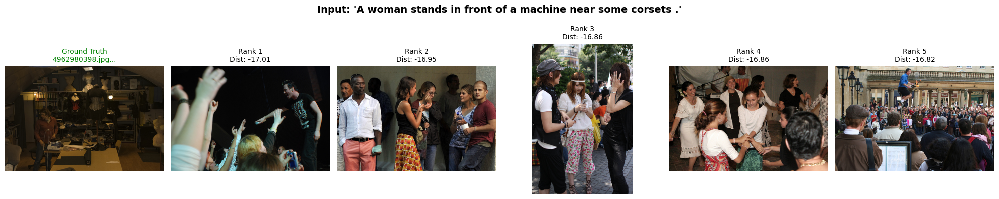

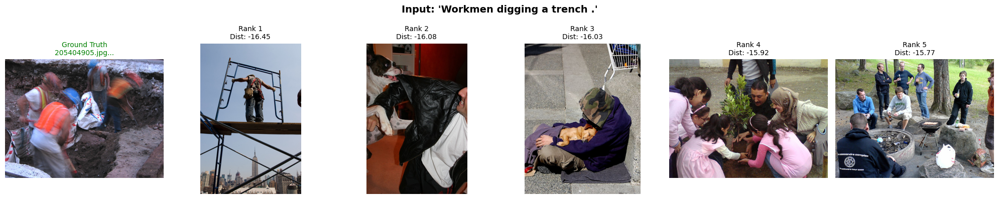

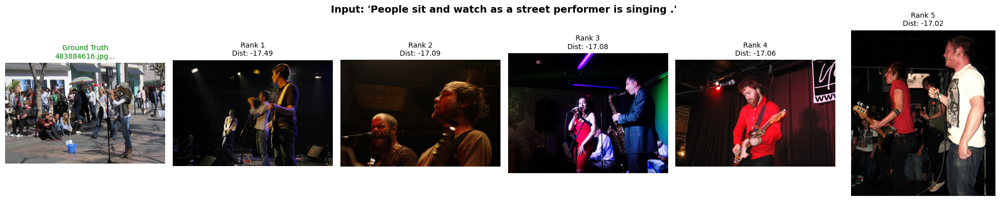

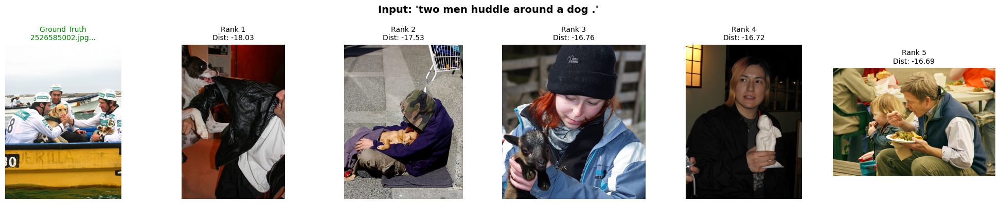

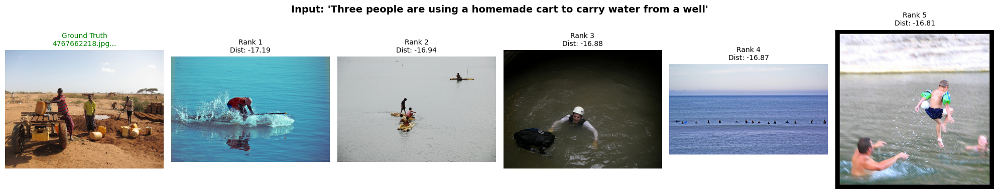

In [12]:
val_caption_text = train_data['captions/text'][~TRAIN_SPLIT]
val_text_embd = X_val
img_VAL_SPLIT = label[~TRAIN_SPLIT].sum(dim=0) > 0
val_img_file = train_data['images/names'][img_VAL_SPLIT]
val_img_embd = torch.from_numpy(train_data['images/embeddings'][img_VAL_SPLIT])
val_label = np.nonzero(train_data['captions/label'][~TRAIN_SPLIT][:,img_VAL_SPLIT])[1]

# Visualizza 5 esempi random
for i in range(5):
    idx = np.random.randint(0, len(val_text_embd))
    caption_embd = val_text_embd[idx:idx+1].to(DEVICE)
    caption_text = val_caption_text[idx]
    gt_index = val_label[idx]

    with torch.no_grad():
        pred_embds = GEODESIC_FN(caption_embd).cpu()

    visualize_retrieval(
        pred_embds,
        gt_index,
        val_img_file,
        caption_text,
        val_img_embd,
        k=5
    )


In [13]:
class ResidualAdapter(nn.Module):
    def __init__(self, input_dim=1024, output_dim=1536, hidden=4096, dropout=0.2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim + output_dim, hidden),
            nn.GELU(),
            nn.LayerNorm(hidden),
            nn.Dropout(dropout),
            nn.Linear(hidden, output_dim)  # <-- niente Tanh
        )
    def forward(self, x, geo_pred):
        return geo_pred + self.net(torch.cat([x, geo_pred], dim=-1))


In [14]:
def info_nce_hard(pred, target, temp=0.05, hard_k=32):
    pred_n = F.normalize(pred, dim=-1)
    targ_n = F.normalize(target, dim=-1)
    sim = pred_n @ targ_n.T / temp                       # [B,B]
    mask = torch.eye(sim.size(0), device=sim.device).bool()
    sim_neg = sim.masked_fill(mask, -9e9)
    topk_vals, _ = torch.topk(sim_neg, k=min(hard_k, sim_neg.size(1)-1), dim=1)
    sim_hard = torch.cat([sim.diag().unsqueeze(1), topk_vals], dim=1)
    labels = torch.zeros(sim.size(0), dtype=torch.long, device=sim.device)
    return F.cross_entropy(sim_hard, labels)

def norm_match(pred, target):
    return F.mse_loss(pred.norm(dim=-1), target.norm(dim=-1))


In [21]:
def residual_loss(Y_pred, Y_true):
    mse = F.mse_loss(Y_pred, Y_true)
    cos = 1 - F.cosine_similarity(Y_pred, Y_true, dim=-1).mean()
    nce = info_nce_hard(Y_pred, Y_true, temp=0.05, hard_k=32)
    nm  = norm_match(Y_pred, Y_true)
    # stessi pesi in train e in val
    return 0.35*mse + 0.25*cos + 0.40*nce + 0.05*nm

In [22]:
def train_residual_model(model, train_loader, val_loader,
                         lr=1e-4, epochs=10, device="cpu"):
    
    opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=0.05)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        opt, max_lr=2e-4, epochs=epochs, steps_per_epoch=len(train_loader),
        pct_start=0.1, anneal_strategy='cos'
    )
    best_val = float("inf")

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for Xb, Yb in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            Xb, Yb = Xb.to(device), Yb.to(device)

            with torch.no_grad():
                geo_pred = GEODESIC_FN(Xb)

            Y_pred = model(Xb, geo_pred)
            loss = residual_loss(Y_pred, Yb)

            opt.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()
            scheduler.step()

            train_loss += loss.item()
        train_loss /= len(train_loader)

        # --- validation (stessa loss!) ---
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for Xb, Yb in val_loader:
                Xb, Yb = Xb.to(device), Yb.to(device)
                geo_pred = GEODESIC_FN(Xb)
                Y_pred = model(Xb, geo_pred)
                val_loss += residual_loss(Y_pred, Yb).item()
        val_loss /= len(val_loader)

        print(f"Epoch {epoch+1}: train={train_loss:.4f} | val={val_loss:.4f}")

        if val_loss < best_val:
            best_val = val_loss
            torch.save(model.state_dict(), "models/residual_adapter_best.pth")
            print(f"  ✓ Saved best model (val_loss={val_loss:.4f})")

    return model

In [23]:
# inizializza il modello
model = ResidualAdapter().to(DEVICE)

# addestra
model = train_residual_model(
    model, train_loader, val_loader,
    lr=1e-4, epochs=20, device=DEVICE
)

Epoch 1/20: 100%|██████████| 440/440 [01:00<00:00,  7.27it/s]


Epoch 1: train=1.4887 | val=1.5779
  ✓ Saved best model (val_loss=1.5779)


Epoch 2/20:  50%|████▉     | 218/440 [00:29<00:30,  7.32it/s]


KeyboardInterrupt: 

In [20]:
with torch.no_grad():
    geo_pred = GEODESIC_FN(X_val.to(DEVICE))
    z_pred_val = model(X_val.to(DEVICE), geo_pred).cpu()


# correzioni metriche
mean_pred = z_pred_val.norm(dim=-1).mean()
mean_true = y_val.norm(dim=-1).mean()
scale = mean_true / mean_pred
z_pred_val *= scale
R = orthogonal_procrustes(z_pred_val, y_val.cpu())
z_pred_val = z_pred_val @ R

# valutazione
results = evaluate_retrieval(
    translated_embd=z_pred_val,
    image_embd=y_val.cpu(),
    gt_indices=np.arange(len(y_val)),
    max_indices=50,
    batch_size=128
)
for k, v in results.items():
    print(f"{k:>12}: {v:.4f}")


         mrr: 0.4391
        ndcg: 0.5742
 recall_at_1: 0.1953
 recall_at_3: 0.5628
 recall_at_5: 0.9259
recall_at_10: 0.9799
recall_at_50: 0.9998
     l2_dist: 20.5467


mrr: 0.4389

ndcg: 0.5743

recall_at_1: 0.1922

recall_at_3: 0.5670

recall_at_5: 0.9346

recall_at_10: 0.9810

recall_at_50: 0.9996

l2_dist: 21.1326

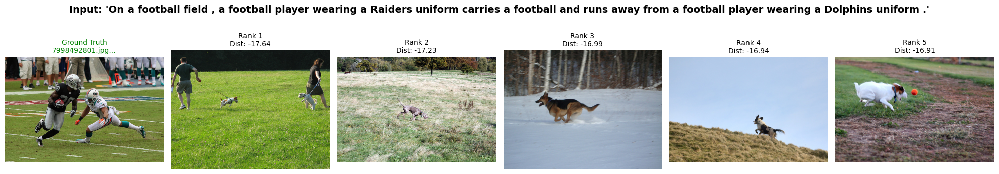

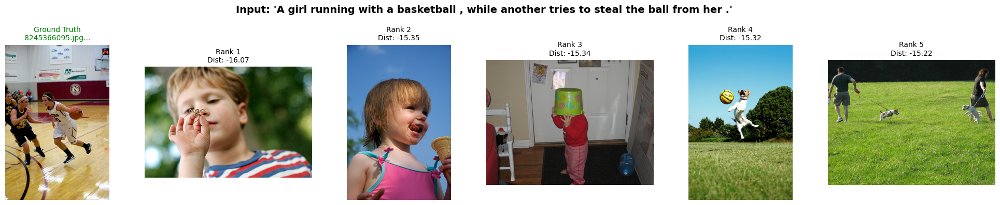

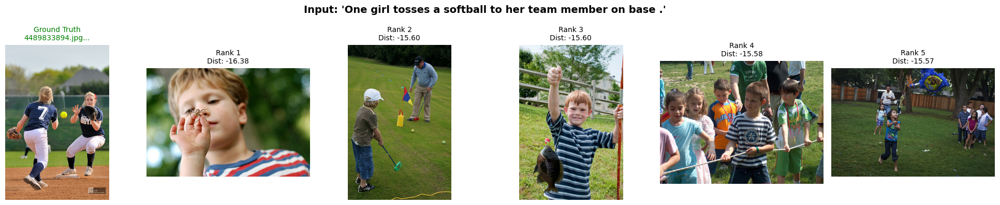

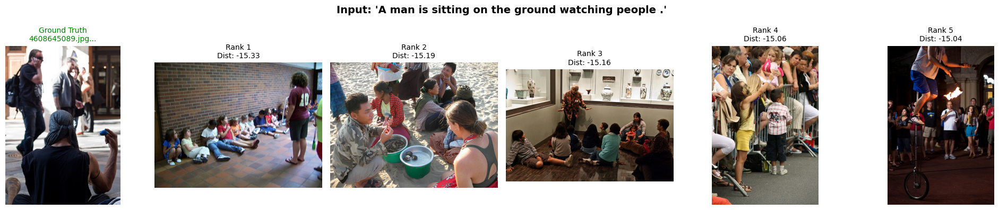

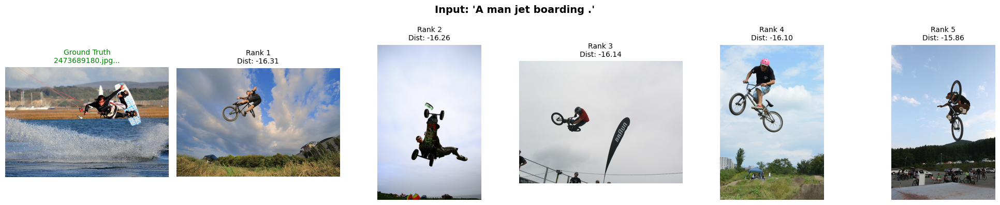

In [24]:
val_caption_text = train_data['captions/text'][~TRAIN_SPLIT]
val_text_embd = X_val
img_VAL_SPLIT = label[~TRAIN_SPLIT].sum(dim=0) > 0
val_img_file = train_data['images/names'][img_VAL_SPLIT]
val_img_embd = torch.from_numpy(train_data['images/embeddings'][img_VAL_SPLIT])
val_label = np.nonzero(train_data['captions/label'][~TRAIN_SPLIT][:,img_VAL_SPLIT])[1]

# Visualizza 5 esempi random
for i in range(5):
    idx = np.random.randint(0, len(val_text_embd))
    caption_embd = val_text_embd[idx:idx+1].to(DEVICE)
    caption_text = val_caption_text[idx]
    gt_index = val_label[idx]

    with torch.no_grad():
        pred_embds = zero_shot_translate_gaussian(
            caption_embd, A_X, A_Y, sigma=SIGMA, topk=TOPK
        ).cpu()

    visualize_retrieval(
        pred_embds,
        gt_index,
        val_img_file,
        caption_text,
        val_img_embd,
        k=5
    )


In [26]:
test_data = load_data("data/test/test.clean.npz")
test_embds = torch.from_numpy(test_data['captions/embeddings']).float()

model = ResidualAdapter().to(DEVICE)
model.load_state_dict(torch.load("models/residual_adapter_best.pth"))
model.eval()

with torch.no_grad():
    geo_pred = GEODESIC_FN(test_embds.to(DEVICE))
    pred_embds = model(test_embds.to(DEVICE), geo_pred).cpu()


# (opzionale) applica la stessa correzione di scala e Procrustes del validation
mean_pred = pred_embds.norm(dim=-1).mean()
scale = (A_Y.norm(dim=-1).mean() / mean_pred).item()  # float puro
pred_embds *= scale

submission = generate_submission(test_data['captions/ids'], pred_embds, 'submission.csv')
print("✅ Submission saved to: submission.csv")


Generating submission file...
✓ Saved submission to submission.csv
✅ Submission saved to: submission.csv


---